In [329]:
import os
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
from PIL import Image

from nanoowl.owl_predictor import OwlPredictor
from nanoowl.tree_predictor import (
    TreePredictor, Tree
)
from nanoowl.tree_drawing import draw_tree_output


from nanoowl.tree import Tree
from nanoowl.tree_predictor import TreeOutput

In [278]:
predictor = TreePredictor(
        owl_predictor=OwlPredictor(
            "google/owlvit-base-patch32",
            image_encoder_engine="../Models/owl_image_encoder_patch32.engine"
    )
)

[11/18/2023-17:08:34] [TRT] [W] CUDA lazy loading is not enabled. Enabling it can significantly reduce device memory usage and speed up TensorRT initialization. See "Lazy Loading" section of CUDA documentation https://docs.nvidia.com/cuda/cuda-c-programming-guide/index.html#lazy-loading


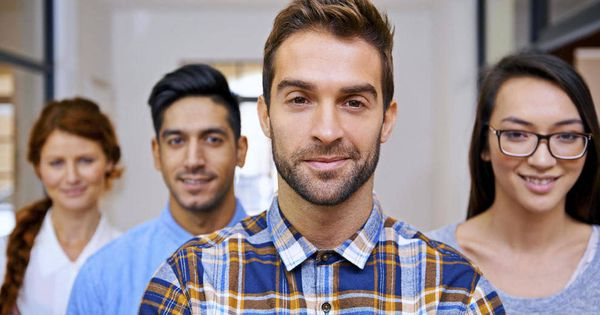

In [445]:
image_bgr = cv2.imread('../Data/people_image.jpg')
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
image_pil = Image.fromarray(image_rgb)
image_pil

In [446]:
input_prompt = "[a person [a face [a glasses]]]"
#input_prompt = "[a person]"

threshold = 0.03

[11/18/2023-17:41:18] [TRT] [W] The enqueue() method has been deprecated when used with engines built from a network created with NetworkDefinitionCreationFlag::kEXPLICIT_BATCH flag. Please use enqueueV2() instead.
[11/18/2023-17:41:18] [TRT] [W] Also, the batchSize argument passed into this function has no effect on changing the input shapes. Please use setBindingDimensions() function to change input shapes instead.
[11/18/2023-17:41:18] [TRT] [W] The enqueue() method has been deprecated when used with engines built from a network created with NetworkDefinitionCreationFlag::kEXPLICIT_BATCH flag. Please use enqueueV2() instead.
[11/18/2023-17:41:18] [TRT] [W] Also, the batchSize argument passed into this function has no effect on changing the input shapes. Please use setBindingDimensions() function to change input shapes instead.
[11/18/2023-17:41:18] [TRT] [W] The enqueue() method has been deprecated when used with engines built from a network created with NetworkDefinitionCreationFla

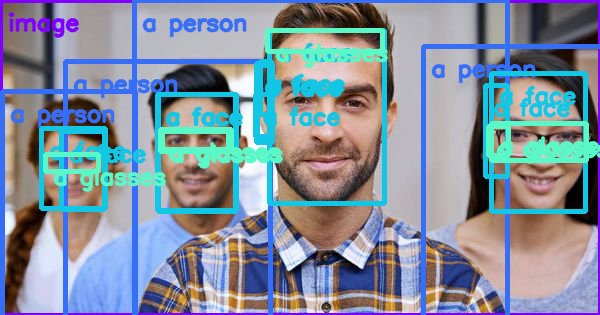

In [447]:
tree = Tree.from_prompt(input_prompt)
clip_text_encodings = predictor.encode_clip_text(tree)
owl_text_encodings = predictor.encode_owl_text(tree)

output = predictor.predict(
        image=image_pil, 
        tree=tree,
        clip_text_encodings=clip_text_encodings,
        owl_text_encodings=owl_text_encodings,
        threshold=threshold
    )

result_image = draw_tree_output(image_pil, output, tree)
result_image

In [483]:
def extract_detections(output_vit: TreeOutput, tree_vit: Tree):

    boxes_xyxy = []
    classes = []
    scores = []

    detections = output_vit.detections
    list_labels = tree_vit.to_dict()['labels'][1:]
    list_labels = [x.replace('a ','').replace('an ','') for x in list_labels]
    output_names = dict(zip(list(range(len(list_labels))), list_labels))

    for detection in detections:

        box = [int(x) for x in detection.box]
        label = detection.labels[0] - 1
        score = detection.scores[0]

        if label >= 0:
            
            boxes_xyxy.append(box)
            classes.append(label)
            scores.append(score)
    
    return output_names, boxes_xyxy, classes, scores

In [484]:
label_dict, boxes, classes, scores = extract_detections(output, tree)

In [485]:
label_dict

{0: 'person', 1: 'face', 2: 'glasses'}

In [486]:
def apply_NMS(boxes, classes, scores, score_threshold=0.0, iou_threshold=0.5):
    unique_classes = set(classes)
    final_boxes, final_classes, final_scores = [], [], []

    for cls in unique_classes:
        # Filtrar cajas, puntuaciones y clases por clase actual
        idxs = [i for i, c in enumerate(classes) if c == cls]
        boxes_cls = [boxes[i] for i in idxs]
        scores_cls = [scores[i] for i in idxs]

        # Convertir a NumPy arrays
        boxes_np = np.array(boxes_cls)
        scores_np = np.array(scores_cls)

        # Aplicar NMS
        nms_indices = cv2.dnn.NMSBoxes(boxes_np, scores_np, score_threshold, iou_threshold)

        if len(nms_indices) == 0:
            continue

        if nms_indices.ndim > 1:
            nms_indices = nms_indices.squeeze()

        # Agregar resultados filtrados a las listas finales
        for i in nms_indices:
            final_boxes.append(boxes_cls[i])
            final_scores.append(scores_cls[i])
            final_classes.append(cls)

    return final_boxes, final_classes, final_scores

In [487]:
boxes, classes, scores = apply_NMS(boxes, classes, scores, 0, 0.6)

In [488]:
def plot_predictions(image_bgr, detection_boxes, detection_classes, detection_confidences, classes_dict):
    output_image = image_bgr.copy()

    # Define an extensive list of colors
    colors = [
        (255, 0, 0), (0, 255, 0), (0, 0, 255), 
        (255, 255, 0), (0, 255, 255), (255, 0, 255), 
        (128, 128, 128), (128, 0, 0), (128, 128, 0), 
        (0, 128, 0), (128, 0, 128), (0, 128, 128), 
        (0, 0, 128), (255, 128, 128), (128, 255, 128), 
        (128, 128, 255), (255, 128, 0), (128, 255, 0), 
        (0, 255, 128), (0, 128, 255), (255, 0, 128), 
        (128, 0, 255), (255, 255, 128), (255, 128, 255), 
        (128, 255, 255), (192, 192, 192), (64, 64, 64), 
        (64, 0, 0), (64, 64, 0), (0, 64, 0)
    ]

    # Calculate the font scale factor based on the image size
    height, width = image_bgr.shape[:2]
    font_scale = max(width, height) / 1000  # Adjust this value as needed

    # Adjust text location offset based on the image size
    x_offset = width // 110  # Horizontal offset
    y_offset = height // 28  # Vertical offset

    for i in range(len(detection_boxes)):
        # Boxes
        xmin, ymin, xmax, ymax = detection_boxes[i]
        start_point = (xmin, ymin)
        end_point = (xmax, ymax)

        # Assign a color based on the class using modulo to avoid errors
        class_id = detection_classes[i]
        color = colors[class_id % len(colors)]

        output_image = cv2.rectangle(output_image, start_point, end_point, color, 2)

        # Classes and scores
        text_location = (xmin + x_offset, ymin + y_offset)  # Adjusted text location
        text = f'{classes_dict[class_id]}-{str(round(detection_confidences[i], 2))}'

        output_image = cv2.putText(output_image, text, text_location, cv2.FONT_HERSHEY_COMPLEX_SMALL, font_scale, color, 1, cv2.LINE_AA)

    return output_image

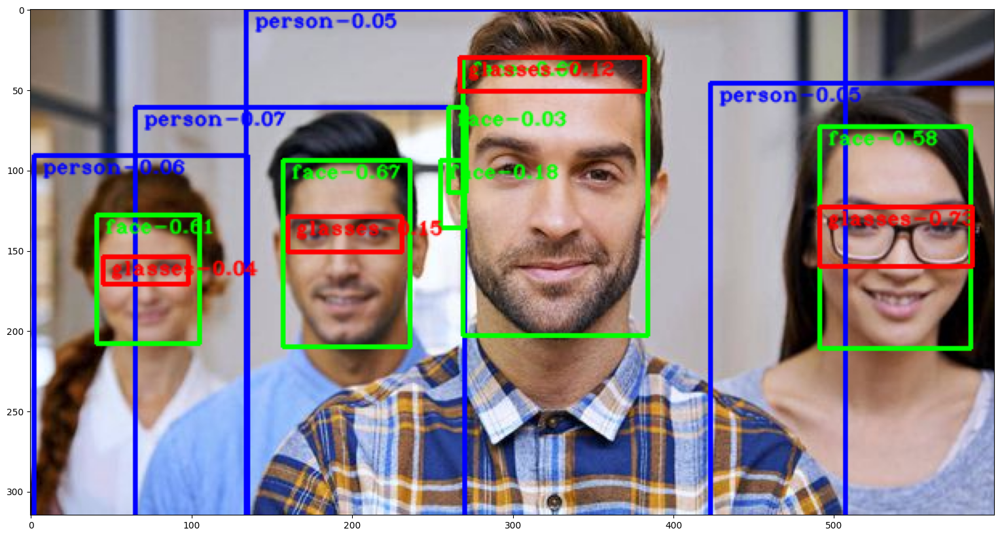

In [489]:
output_plot = plot_predictions(image_bgr, boxes, classes, scores, label_dict)

fig, ax = plt.subplots()
plt.imshow(cv2.cvtColor(output_plot, cv2.COLOR_BGR2RGB))
fig.set_size_inches(19, 11)

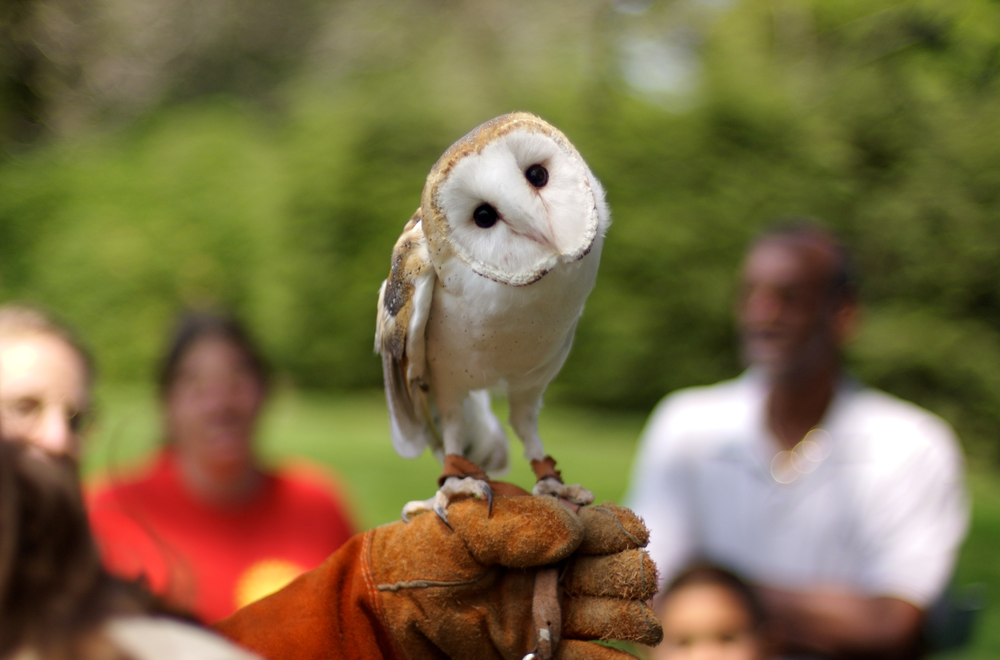

In [490]:
image_bgr = cv2.imread('../Data/owl_glove.jpg')
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
image_pil = Image.fromarray(image_rgb)
image_pil

[11/18/2023-17:43:07] [TRT] [W] The enqueue() method has been deprecated when used with engines built from a network created with NetworkDefinitionCreationFlag::kEXPLICIT_BATCH flag. Please use enqueueV2() instead.
[11/18/2023-17:43:07] [TRT] [W] Also, the batchSize argument passed into this function has no effect on changing the input shapes. Please use setBindingDimensions() function to change input shapes instead.
[11/18/2023-17:43:07] [TRT] [W] The enqueue() method has been deprecated when used with engines built from a network created with NetworkDefinitionCreationFlag::kEXPLICIT_BATCH flag. Please use enqueueV2() instead.
[11/18/2023-17:43:07] [TRT] [W] Also, the batchSize argument passed into this function has no effect on changing the input shapes. Please use setBindingDimensions() function to change input shapes instead.
[11/18/2023-17:43:07] [TRT] [W] The enqueue() method has been deprecated when used with engines built from a network created with NetworkDefinitionCreationFla

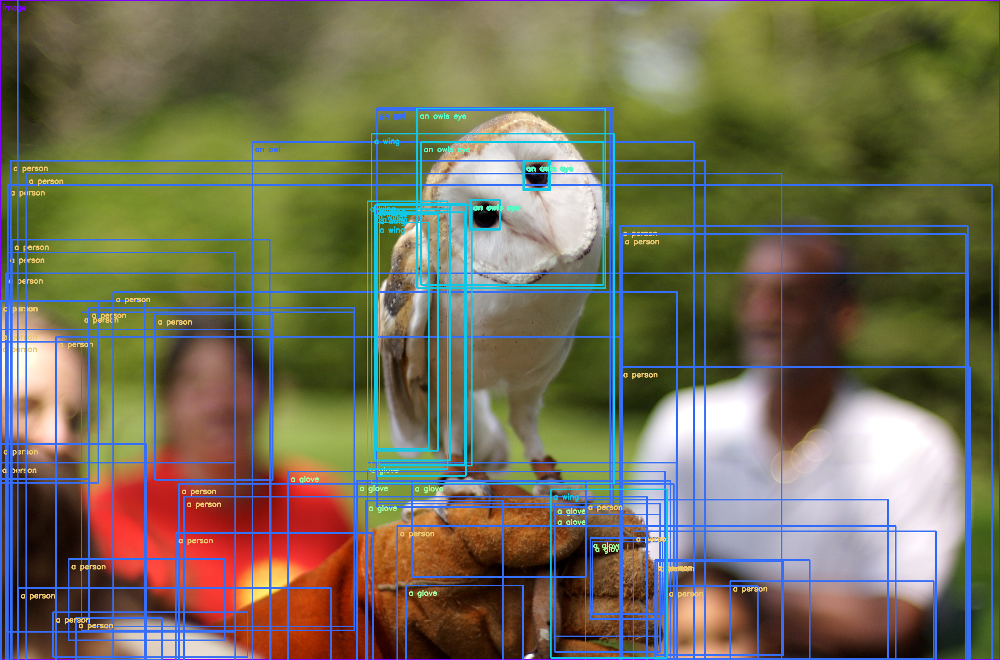

In [491]:
input_prompt = "[an owl [a wing, an owls eye], a glove, a person]"

threshold = 0.01

tree = Tree.from_prompt(input_prompt)
clip_text_encodings = predictor.encode_clip_text(tree)
owl_text_encodings = predictor.encode_owl_text(tree)

output = predictor.predict(
        image=image_pil, 
        tree=tree,
        clip_text_encodings=clip_text_encodings,
        owl_text_encodings=owl_text_encodings,
        threshold=threshold
    )

result_image = draw_tree_output(image_pil, output, tree)
result_image

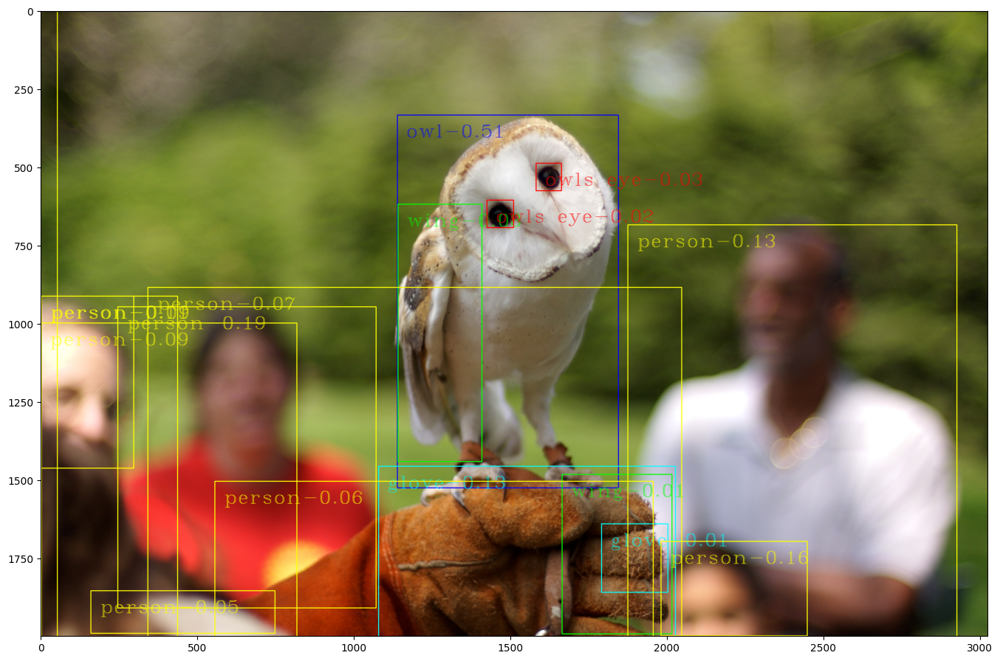

In [492]:
label_dict, boxes, classes, scores = extract_detections(output, tree)

boxes, classes, scores = apply_NMS(boxes, classes, scores, 0, 0.5)

output_plot = plot_predictions(image_bgr, boxes, classes, scores, label_dict)

fig, ax = plt.subplots()
plt.imshow(cv2.cvtColor(output_plot, cv2.COLOR_BGR2RGB))
fig.set_size_inches(19, 11)